This is generated using google colab.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve, median_filter
import cv2



In [4]:

def display_images(original, custom_filtered, opencv_filtered, title):
    fig, ax = plt.subplots(3, 2, figsize=(15, 15))
    ax[0, 0].imshow(original, cmap='gray')
    ax[0, 0].set_title('Original Image')
    ax[0, 1].hist(original.ravel(), bins=256)
    ax[0, 1].set_title('Original Histogram')

    ax[1, 0].imshow(custom_filtered, cmap='gray')
    ax[1, 0].set_title(f'Custom {title} Image')
    ax[1, 1].hist(custom_filtered.ravel(), bins=256)
    ax[1, 1].set_title(f'Custom {title} Histogram')

    ax[2, 0].imshow(opencv_filtered, cmap='gray')
    ax[2, 0].set_title(f'OpenCV {title} Image')
    ax[2, 1].hist(opencv_filtered.ravel(), bins=256)
    ax[2, 1].set_title(f'OpenCV {title} Histogram')

    plt.show()


In [7]:
def mean_filter_custom(image, mask_size):
    kernel = np.ones((mask_size, mask_size)) / (mask_size * mask_size)
    return convolve(image, kernel)

def mean_filter_opencv(image, mask_size):
    return cv2.blur(image, (mask_size, mask_size))



In [9]:
def highpass_filter_custom(image, mask_size):
    kernel = -np.ones((mask_size, mask_size))
    kernel[mask_size//2, mask_size//2] = mask_size*mask_size - 1
    return convolve(image, kernel)

def highpass_filter_opencv(image):
    kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
    return cv2.filter2D(image, -1, kernel)





In [10]:
def lowpass_filter_custom(image, mask_size):
    kernel = np.ones((mask_size, mask_size)) / (mask_size * mask_size)
    return convolve(image, kernel)

def lowpass_filter_opencv(image, mask_size):
    return cv2.blur(image, (mask_size, mask_size))




In [11]:
def bilateral_filter_custom(image, mask_size, sigma_d, sigma_r):
    def gaussian(x, sigma):
        return np.exp(-(x**2) / (2 * sigma**2))

    filtered_image = np.zeros_like(image)
    half_size = mask_size // 2
    for i in range(half_size, image.shape[0] - half_size):
        for j in range(half_size, image.shape[1] - half_size):
            local_region = image[i-half_size:i+half_size+1, j-half_size:j+half_size+1]
            center_pixel = image[i, j]
            distance_weights = gaussian(np.arange(-half_size, half_size+1), sigma_d)
            intensity_weights = gaussian(local_region - center_pixel, sigma_r)
            weights = distance_weights[:, None] * distance_weights[None, :] * intensity_weights
            filtered_image[i, j] = np.sum(weights * local_region) / np.sum(weights)
    return filtered_image

def bilateral_filter_opencv(image, d, sigma_color, sigma_space):
    return cv2.bilateralFilter(image, d, sigma_color, sigma_space)


In [12]:
def gaussian_filter_custom(image, mask_size, sigma):
    def gaussian_kernel(size, sigma):
        ax = np.linspace(-(size // 2), size // 2, size)
        xx, yy = np.meshgrid(ax, ax)
        kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sigma))
        return kernel / np.sum(kernel)

    kernel = gaussian_kernel(mask_size, sigma)
    return convolve(image, kernel)

def gaussian_filter_opencv(image, mask_size, sigma):
    return cv2.GaussianBlur(image, (mask_size, mask_size), sigma)



In [14]:
def laplacian_filter_custom(image, mask_size):
    kernel = np.zeros((mask_size, mask_size))
    kernel[mask_size//2, mask_size//2] = 2
    kernel = kernel - np.ones((mask_size, mask_size)) / (mask_size * mask_size)
    return convolve(image, kernel)

def laplacian_filter_opencv(image):
    return cv2.Laplacian(image, cv2.CV_64F)




In [15]:
def median_filter_custom(image, mask_size):
    return median_filter(image, size=mask_size)

def median_filter_opencv(image, mask_size):
    return cv2.medianBlur(image, mask_size)




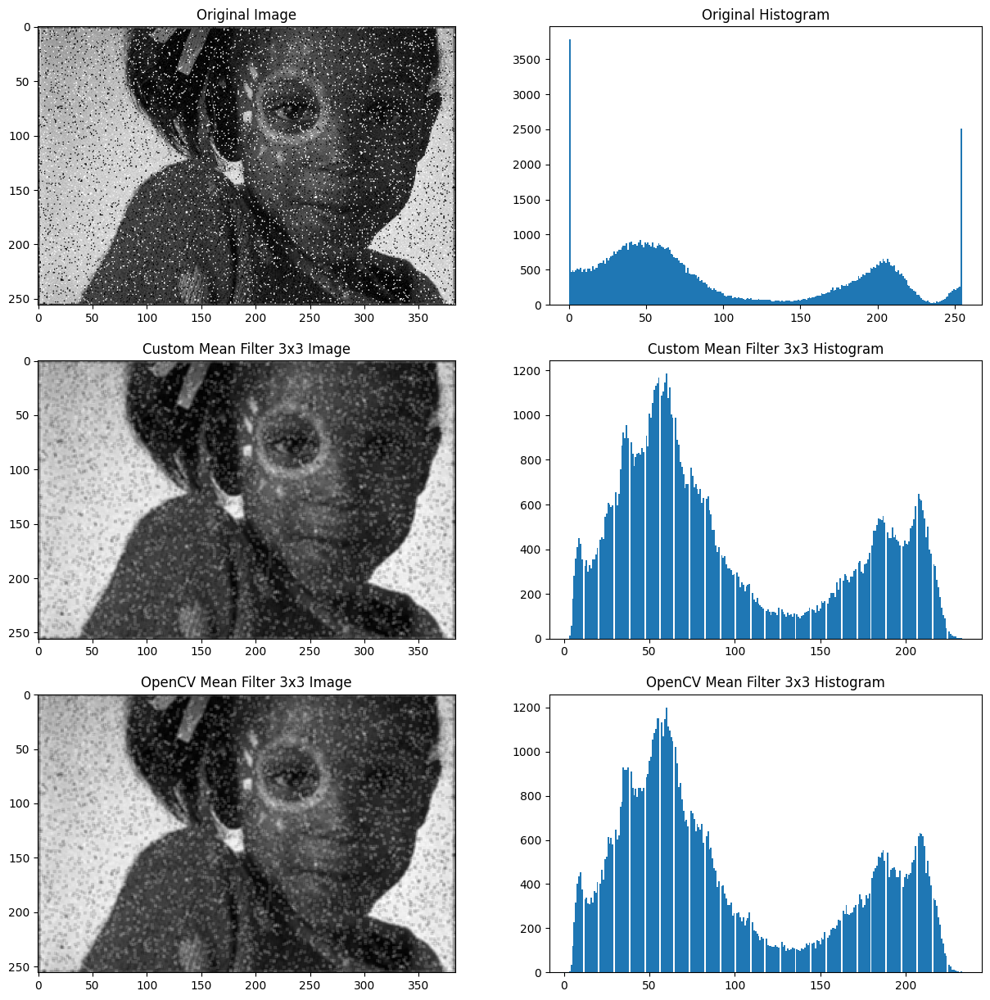

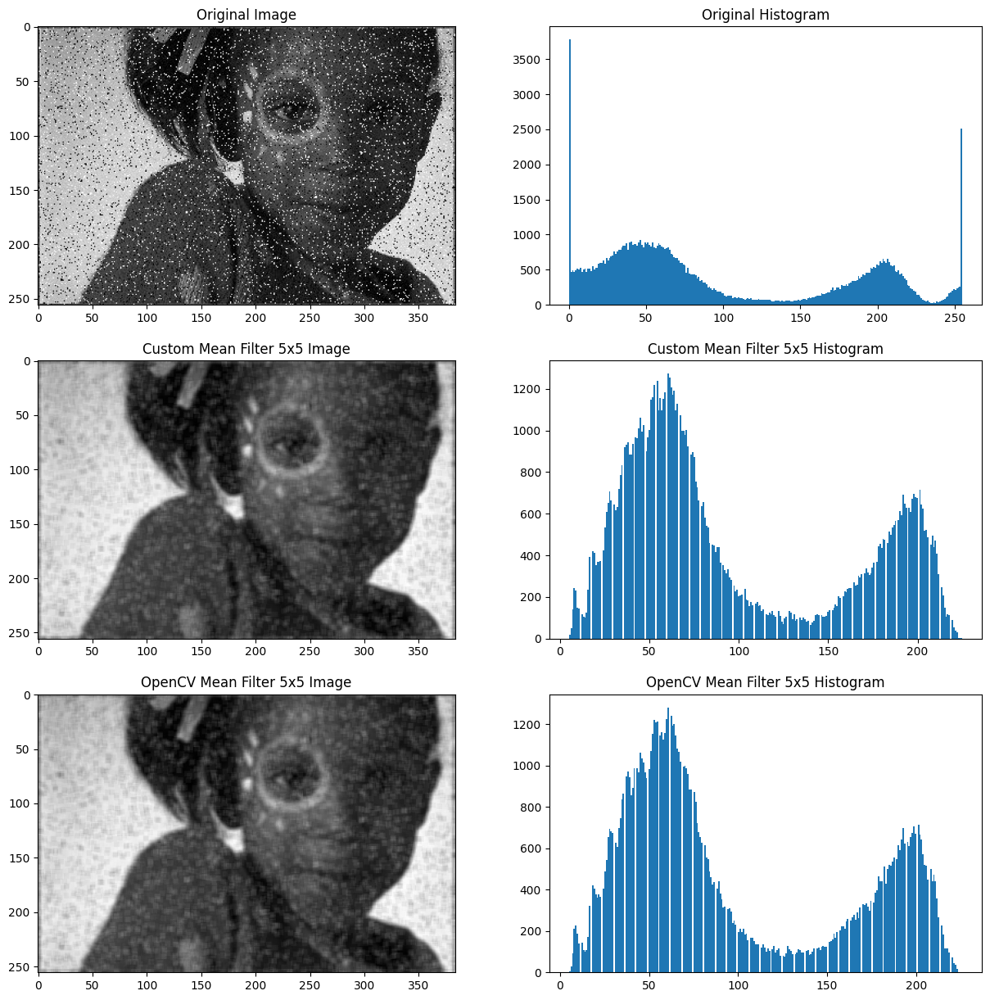

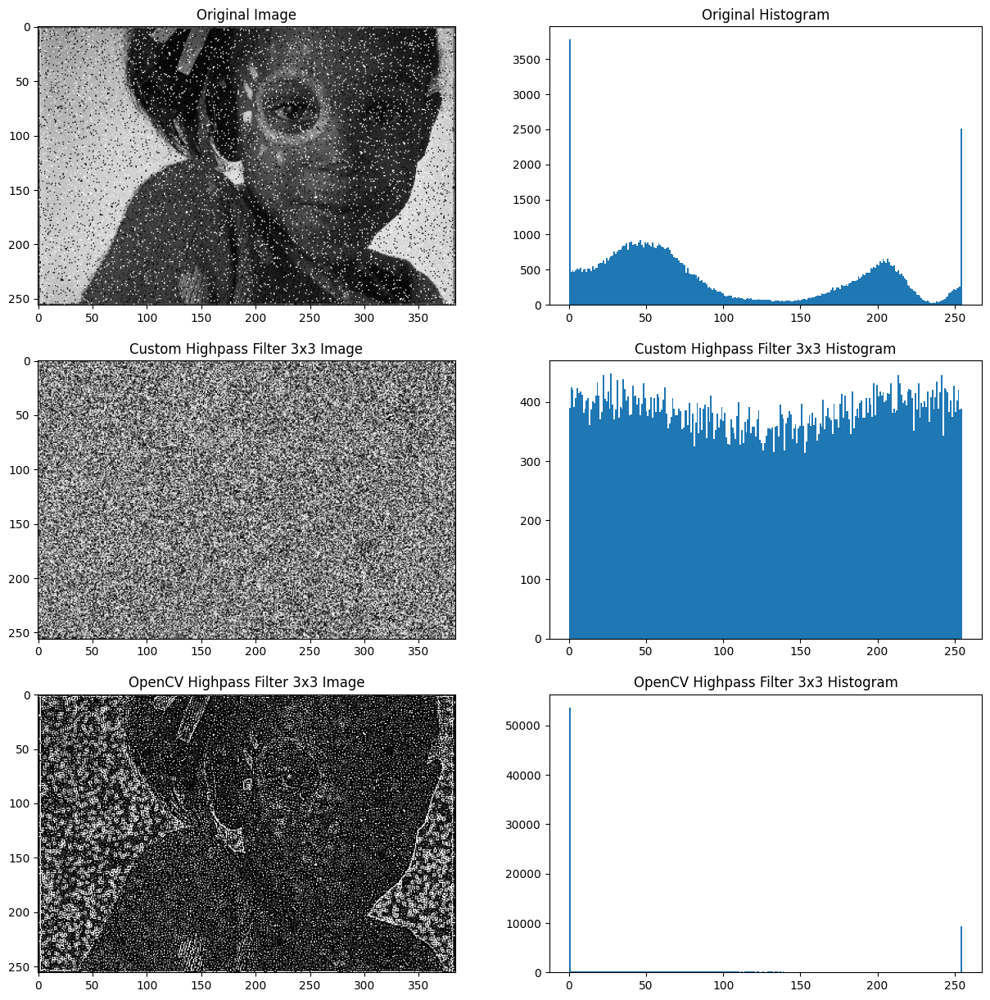

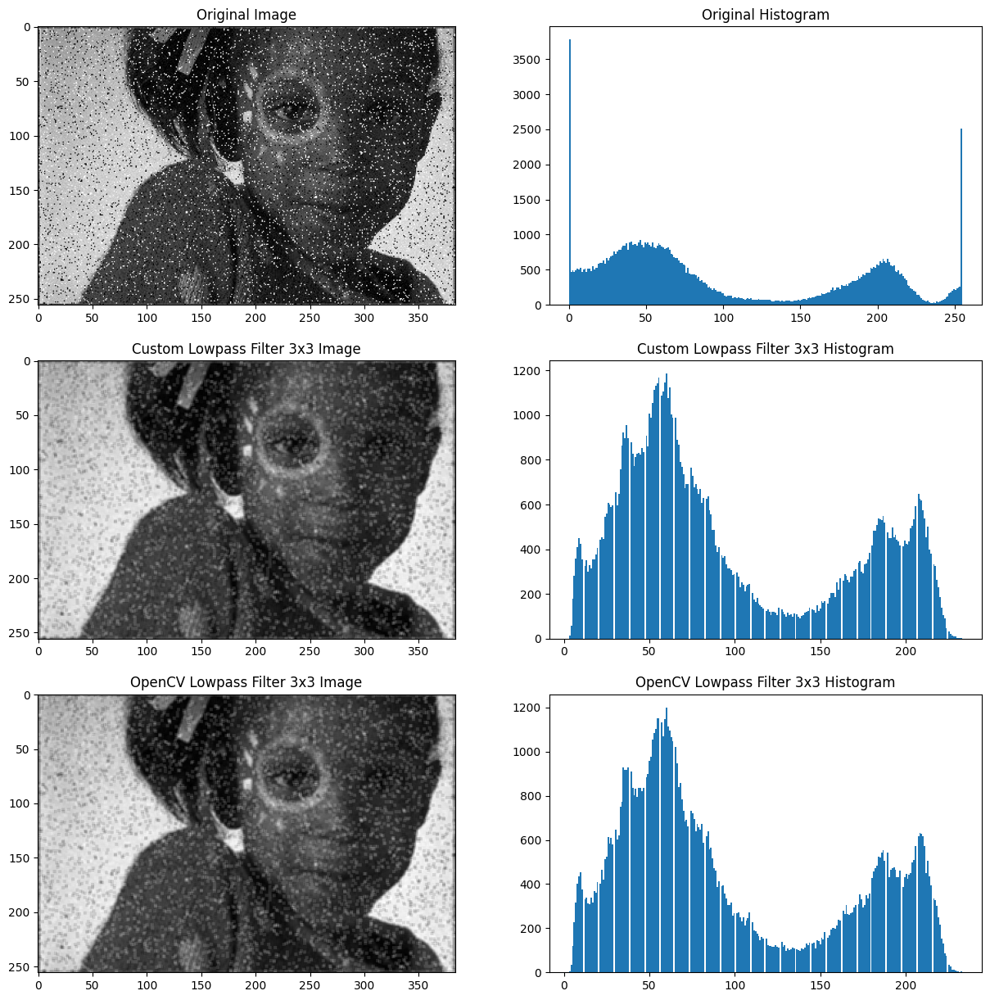

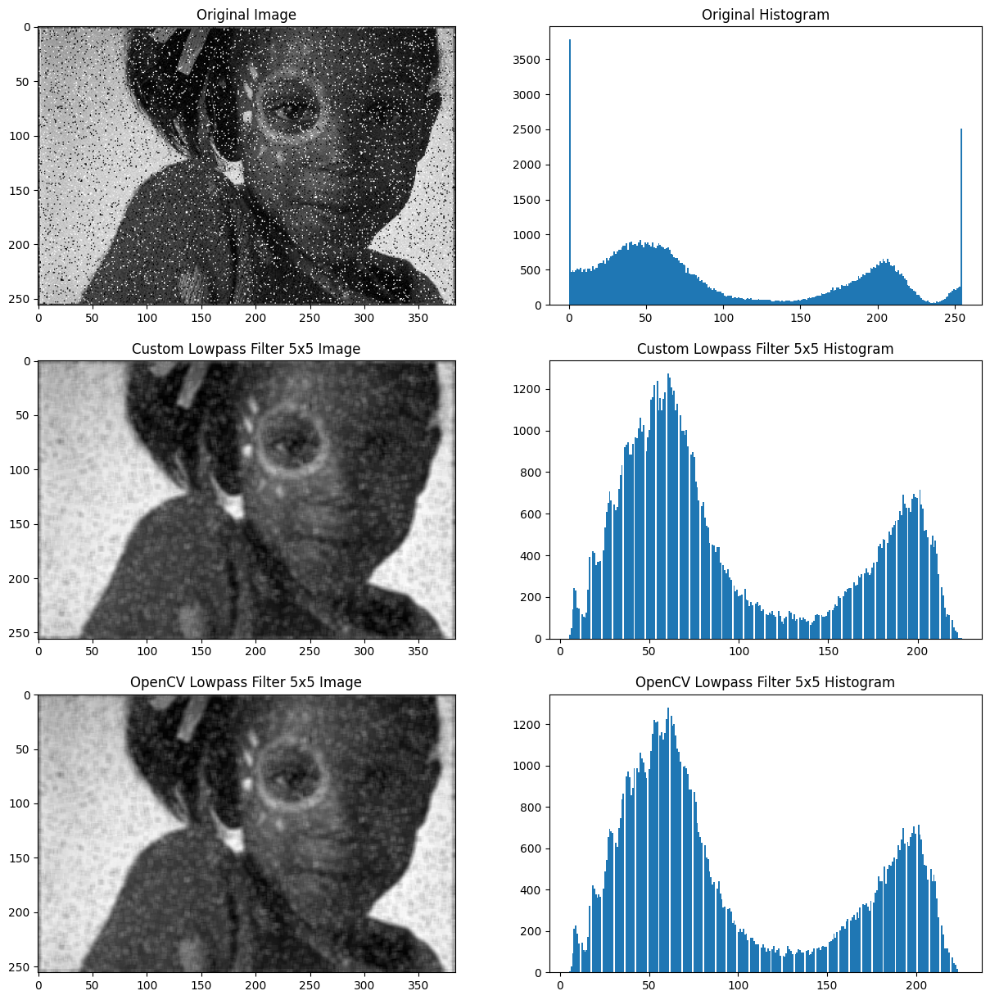

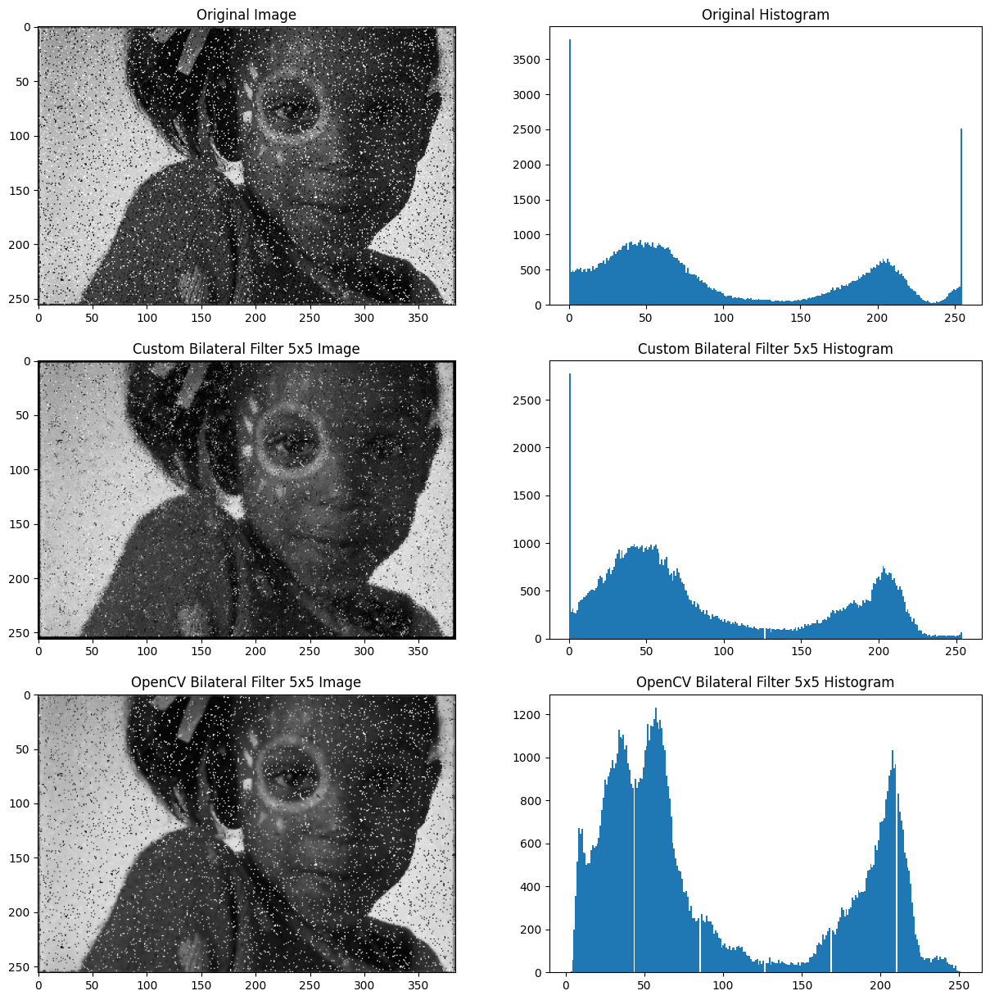

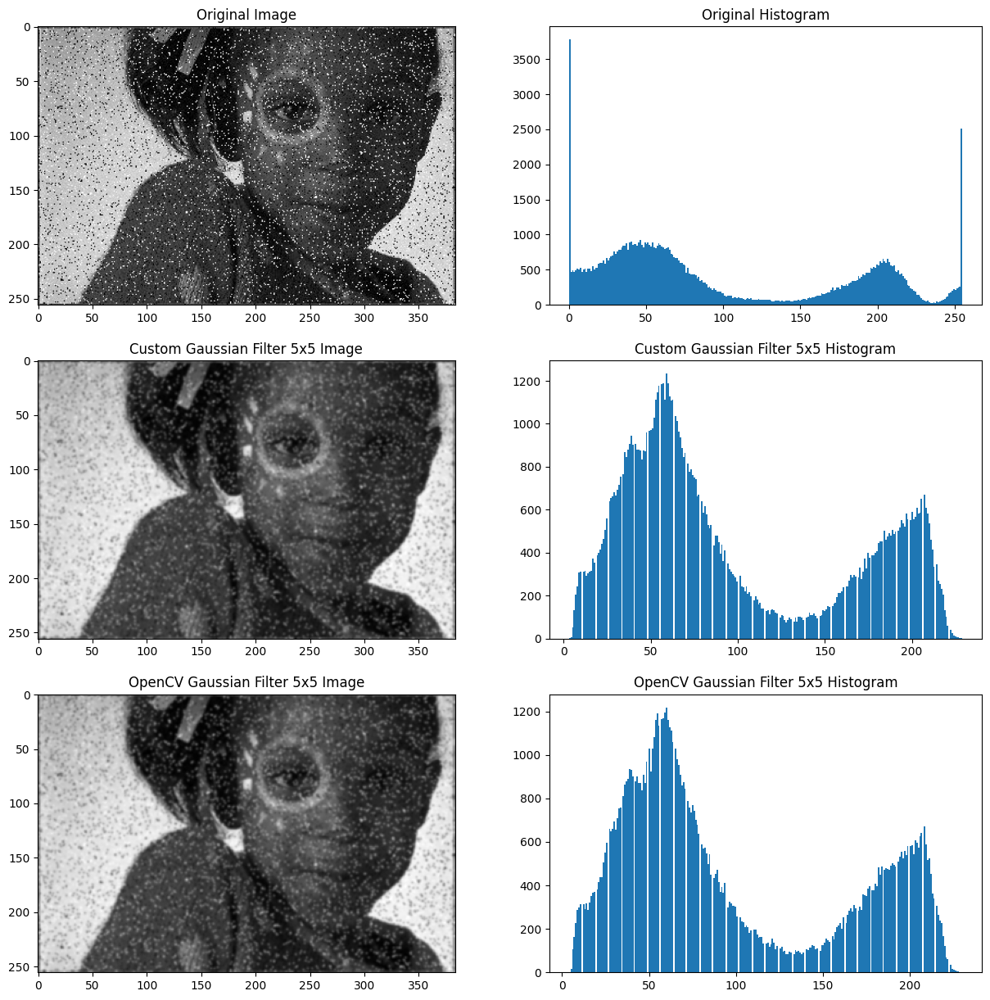

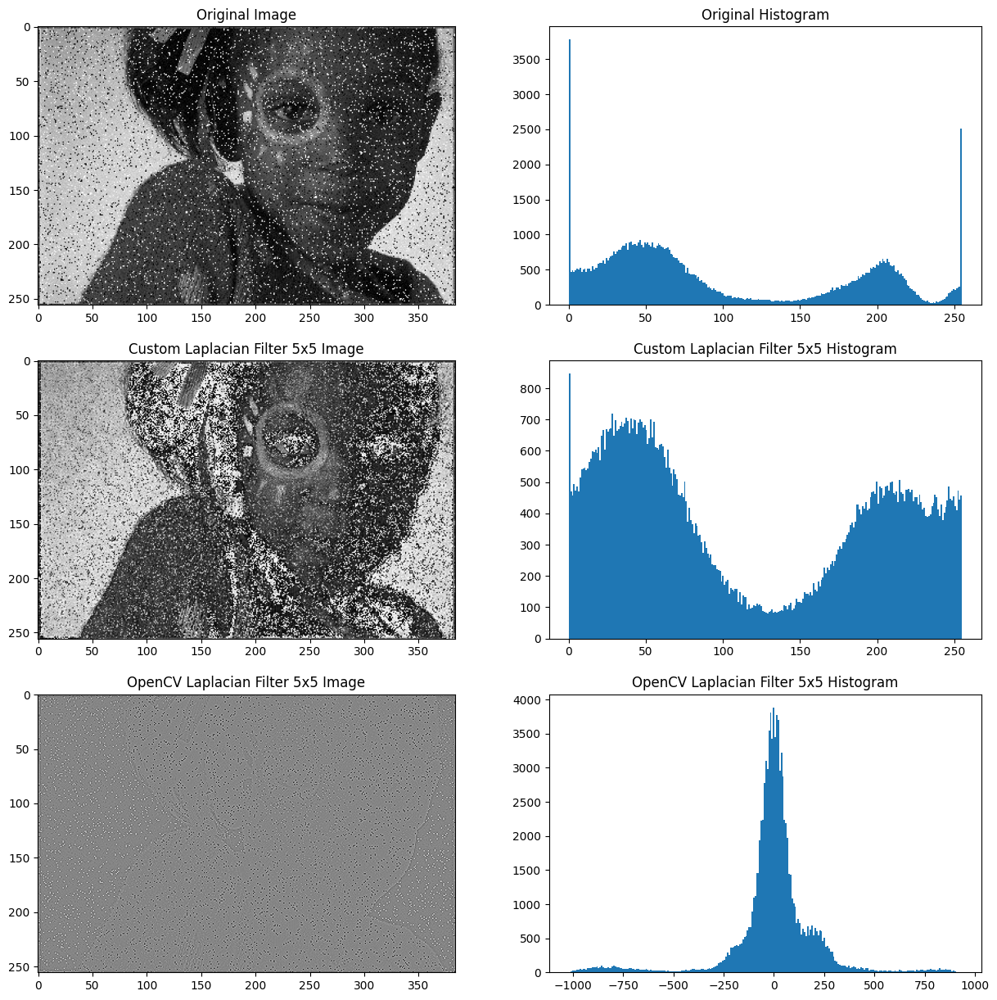

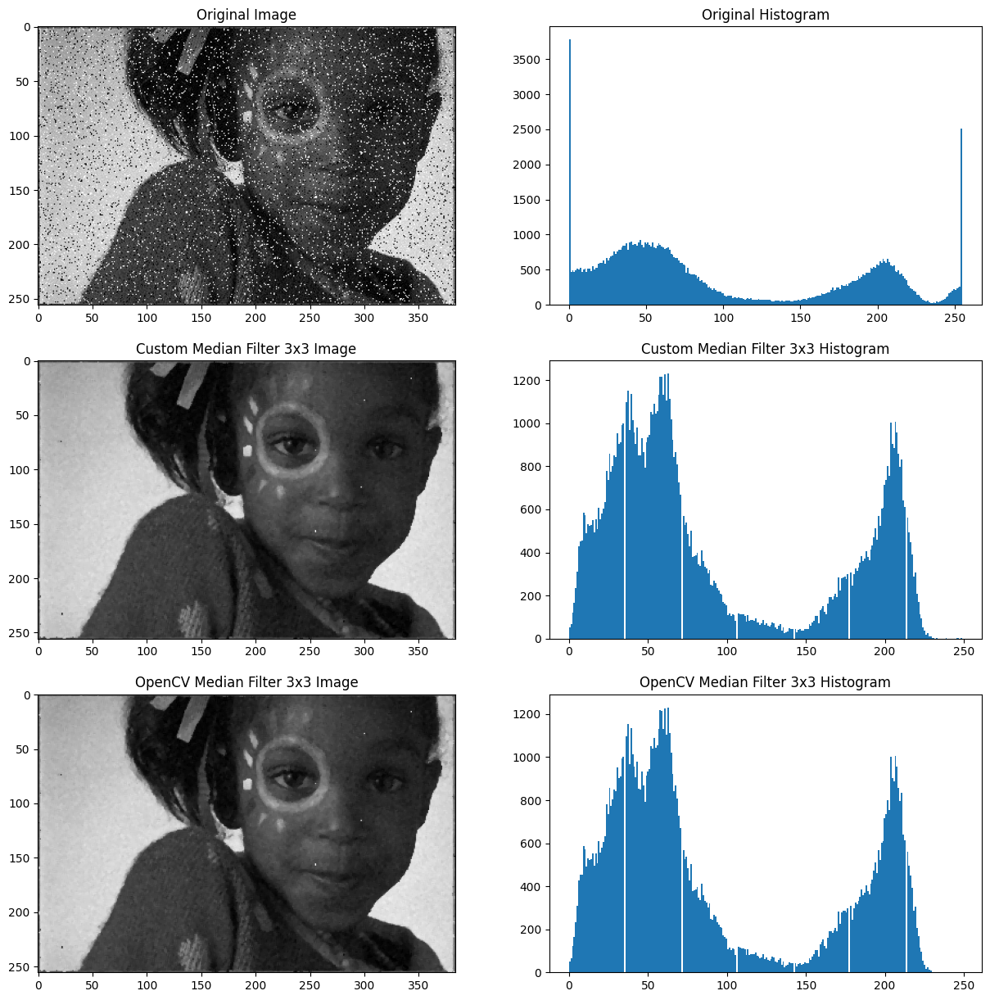

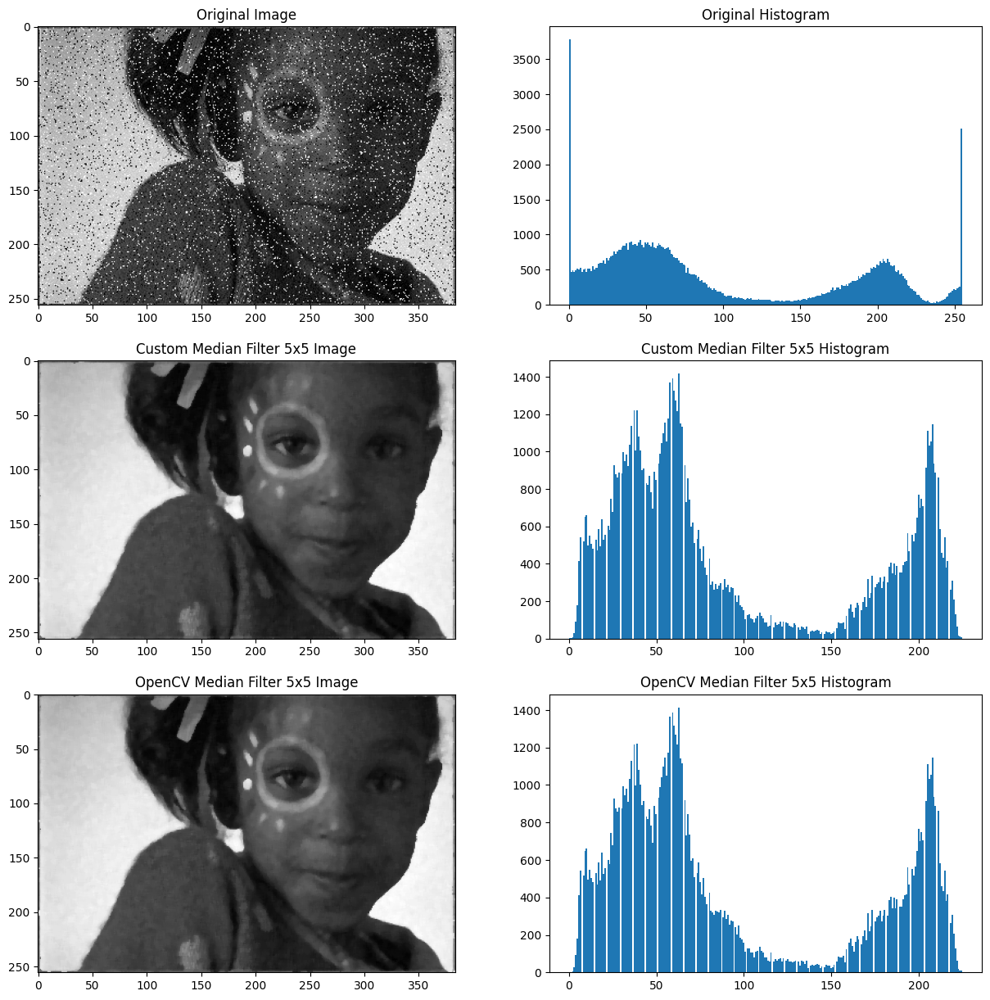

In [16]:
def main():
    image = cv2.imread("/content/img1.jpg",cv2.IMREAD_GRAYSCALE)

    # Apply and display Mean Filter
    custom_mean = mean_filter_custom(image, 3)
    opencv_mean = mean_filter_opencv(image, 3)
    display_images(image, custom_mean, opencv_mean, 'Mean Filter 3x3')

    custom_mean = mean_filter_custom(image, 5)
    opencv_mean = mean_filter_opencv(image, 5)
    display_images(image, custom_mean, opencv_mean, 'Mean Filter 5x5')

    # Apply and display Highpass Filter
    custom_highpass = highpass_filter_custom(image, 3)
    opencv_highpass = highpass_filter_opencv(image)
    display_images(image, custom_highpass, opencv_highpass, 'Highpass Filter 3x3')

    # Apply and display Lowpass Filter
    custom_lowpass = lowpass_filter_custom(image, 3)
    opencv_lowpass = lowpass_filter_opencv(image, 3)
    display_images(image, custom_lowpass, opencv_lowpass, 'Lowpass Filter 3x3')

    custom_lowpass = lowpass_filter_custom(image, 5)
    opencv_lowpass = lowpass_filter_opencv(image, 5)
    display_images(image, custom_lowpass, opencv_lowpass, 'Lowpass Filter 5x5')

    # Apply and display Bilateral Filter
    custom_bilateral = bilateral_filter_custom(image, 5, 2, 2)
    opencv_bilateral = bilateral_filter_opencv(image, 5, 75, 75)  # Experiment with these values
    display_images(image, custom_bilateral, opencv_bilateral, 'Bilateral Filter 5x5')

    # Apply and display Gaussian Filter
    custom_gaussian = gaussian_filter_custom(image, 5, 1)
    opencv_gaussian = gaussian_filter_opencv(image, 5, 1)
    display_images(image, custom_gaussian, opencv_gaussian, 'Gaussian Filter 5x5')

    # Apply and display Laplacian Filter
    custom_laplacian = laplacian_filter_custom(image, 5)
    opencv_laplacian = laplacian_filter_opencv(image)
    display_images(image, custom_laplacian, opencv_laplacian, 'Laplacian Filter 5x5')

    # Apply and display Median Filter
    custom_median = median_filter_custom(image, 3)
    opencv_median = median_filter_opencv(image, 3)
    display_images(image, custom_median, opencv_median, 'Median Filter 3x3')

    custom_median = median_filter_custom(image, 5)
    opencv_median = median_filter_opencv(image, 5)
    display_images(image, custom_median, opencv_median, 'Median Filter 5x5')

if __name__ == "__main__":
    main()